# Random Forest Prediction of Nitrogen Concentration

## 1) Setup

In [3]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd

df = pd.read_excel("data2.xlsx")
train = df[~df['Sample ID'].isnull()].reset_index()

In [4]:
df.columns

Index(['OBJECTID', 'Band 2/Blue', 'Band 3/Green', 'Band 4/Red',
       'Band 5/Red Edge 1', 'Band 6/Red Edge 2', 'Band 7/Red Edge 3',
       'Band 8/NIR 1', 'Band 8A/NIR 2', 'Band 11/SWIR 1', 'Band 12/SWIR 2',
       'NDVI', 'GNDVI', 'EVI', 'GSAVI', 'GOSAVI', 'X Coordinate',
       'Y Coordinate', 'Sample Total Weight (mg)', 'Sample N%', 'Sample C%',
       'Sample ID'],
      dtype='object')

In [5]:


# X = train[['Aerosol Optical Thickness', 'Water Vapor Column',
#        'Band 2/Blue', 'Band 3/Green', 'Band 4/Red', 'Band 8/NIR',
#        'NDVI ((NIR-red)/(NIR+red))', 'Band 1/Aerosol', 'Band 5/Red Edge',
#        'Band 6', 'Band 7', 'Band 8A', 'Band 11', 'Band 12', 'X Coordinate', 'Y Coordinate']]

X = train[['Band 2/Blue', 'Band 3/Green', 'Band 4/Red',
       'Band 5/Red Edge 1', 'Band 6/Red Edge 2', 'Band 7/Red Edge 3',
       'Band 8/NIR 1', 'Band 8A/NIR 2', 'Band 11/SWIR 1', 'Band 12/SWIR 2',
       'NDVI', 'GNDVI', 'EVI', 'GSAVI', 'GOSAVI']]

y = train[['Sample N%']]

X_values = X.values
y_values = y.values.ravel()  # flatten

## 2) Model Training

In [7]:
rf_model = RandomForestRegressor(
    n_estimators=100, # decent number of trees to reduce variance
    max_depth=2, # shallow to reduce overfitting
    random_state=2
)

# Leave-One-Out Cross-Validation (LOOCV) due to low sample size
loo = LeaveOneOut()
y_true_all = []
y_pred_all = []

for train_idx, test_idx in loo.split(X_values):
    rf_model.fit(X_values[train_idx], y_values[train_idx])
    y_pred = rf_model.predict(X_values[test_idx])
    
    y_true_all.extend(y_values[test_idx])
    y_pred_all.extend(y_pred)

# Calculate errors
mse = mean_squared_error(y_true_all, y_pred_all)
mae = mean_absolute_error(y_true_all, y_pred_all)

# Fitting and prediction
rf_model.fit(X_values, y_values)

X_unlabeled = df[df['Sample ID'].isnull()][X.columns].values
y_pred_unlabeled = rf_model.predict(X_unlabeled)

df.loc[df['Sample ID'].isnull(), 'Predicted Sample N%'] = y_pred_unlabeled

## 3) Evaluation

In [9]:
print(f"LOOCV MSE: {mse:.4f}")
print(f"LOOCV MAE: {mae:.4f}")

LOOCV MSE: 0.8603
LOOCV MAE: 0.8241


In [10]:
feat_importance = pd.Series(rf_model.feature_importances_, index=X.columns)
feat_importance.sort_values(ascending=False, inplace=True)
print(feat_importance)

Band 7/Red Edge 3    0.191350
Band 2/Blue          0.136843
Band 8/NIR 1         0.116458
Band 6/Red Edge 2    0.098213
Band 11/SWIR 1       0.066265
Band 8A/NIR 2        0.065334
Band 5/Red Edge 1    0.063088
NDVI                 0.051257
EVI                  0.049816
Band 3/Green         0.042638
GNDVI                0.039906
Band 4/Red           0.025859
Band 12/SWIR 2       0.025399
GOSAVI               0.017453
GSAVI                0.010124
dtype: float64


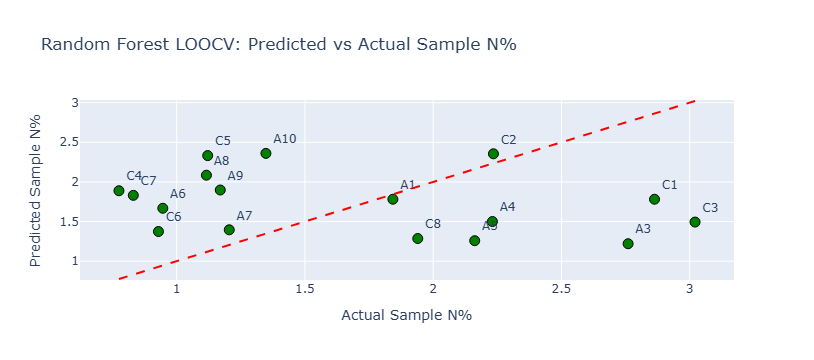

In [11]:
import plotly.express as px
from sklearn.model_selection import LeaveOneOut
import pandas as pd

# Leave-One-Out Cross-Validation predictions
loo = LeaveOneOut()
y_true_all = []
y_pred_loo = []

for train_idx, test_idx in loo.split(X_values):
    rf_model.fit(X_values[train_idx], y_values[train_idx])
    y_pred_loo.append(rf_model.predict(X_values[test_idx])[0])
    y_true_all.append(y_values[test_idx][0])

# Prepare DataFrame
df_plot_loo = pd.DataFrame({
    'Actual': y_true_all,
    'Predicted': y_pred_loo,
    'Sample ID': train['Sample ID']
})

# Create interactive scatter plot
fig = px.scatter(
    df_plot_loo,
    x='Actual',
    y='Predicted',
    text='Sample ID',
    title='Random Forest LOOCV: Predicted vs Actual Sample N%',
    labels={'Actual': 'Actual Sample N%', 'Predicted': 'Predicted Sample N%'},
    color_discrete_sequence=['green']
)

# Add 45-degree reference line
min_val = df_plot_loo[['Actual', 'Predicted']].min().min()
max_val = df_plot_loo[['Actual', 'Predicted']].max().max()
fig.add_shape(
    type='line',
    x0=min_val,
    y0=min_val,
    x1=max_val,
    y1=max_val,
    line=dict(color='red', dash='dash')
)

# Adjust text position and marker style
fig.update_traces(
    textposition='top right',
    marker=dict(size=10, line=dict(width=1, color='black'))
)

fig.show()


## 4) Predictions

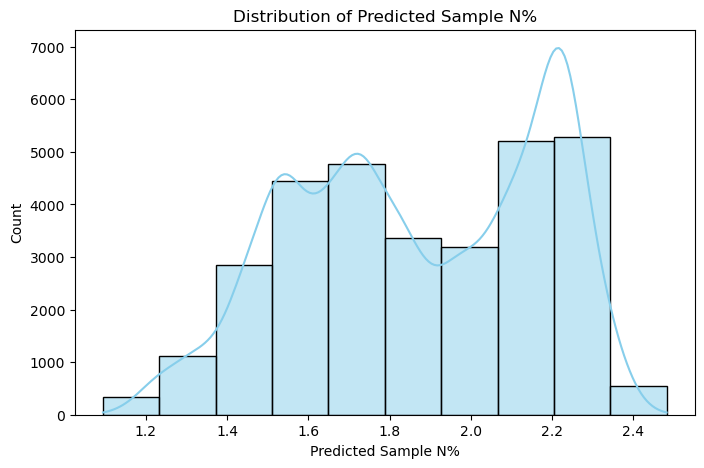

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# y_pred_unlabeled is your predicted array
plt.figure(figsize=(8,5))
sns.histplot(df['Predicted Sample N%'], bins=10, kde=True, color='skyblue')
plt.xlabel('Predicted Sample N%')
plt.ylabel('Count')
plt.title('Distribution of Predicted Sample N%')
plt.show()

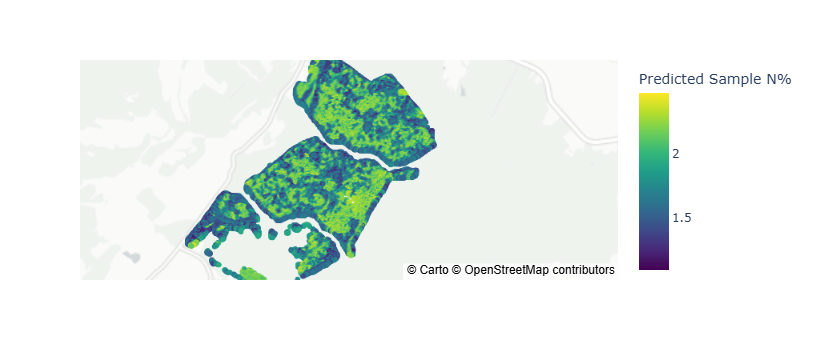

In [14]:
fig = px.scatter_mapbox(
    df,
    lat='Y Coordinate',  # latitude
    lon='X Coordinate',  # longitude
    color='Predicted Sample N%',           # continuous variable
    color_continuous_scale='Viridis',
    size_max=15,
    zoom=10,                 # adjust for your area
    mapbox_style='carto-positron',  # or 'open-street-map', 'carto-darkmatter', etc.
    hover_name='Predicted Sample N%'
)

fig.show()

In [25]:
df.to_csv("output_morven.csv", index=False)